Understanding the Problem:
    * Is the Tweet:
        1. Hate Speech
        2. Offensve
        3. Neither

Data Preparation:
    1. Check for Missing Values
    2. Perform EDA
    Split into Training and Testing Sets

Feature Extraction 
    1. Convert text data to Numerical Form using TF-IDF

Model Selection
    1. Logistic Regression
    2. SVM
    3. Random Forest

Model Training

Model Evaluation:
    1. Accuracy
    2. Precision
    3. Recall
    4. F1-Score



In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.pipeline import make_pipeline
import re
import nltk
from nltk.corpus import stopwords
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\TAZ78\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\TAZ78\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
df = pd.read_csv('HateSpeech_Kenya.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48076 entries, 0 to 48075
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hate_speech         48076 non-null  int64 
 1   offensive_language  48076 non-null  int64 
 2   neither             48076 non-null  int64 
 3   Class               48076 non-null  int64 
 4   Tweet               48076 non-null  object
dtypes: int64(4), object(1)
memory usage: 1.8+ MB


In [3]:
df.isnull().sum()

hate_speech           0
offensive_language    0
neither               0
Class                 0
Tweet                 0
dtype: int64

C:\Users\TAZ78\AppData\Local\Temp\ipykernel_9388\3568656554.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Class', data=df, palette='viridis')


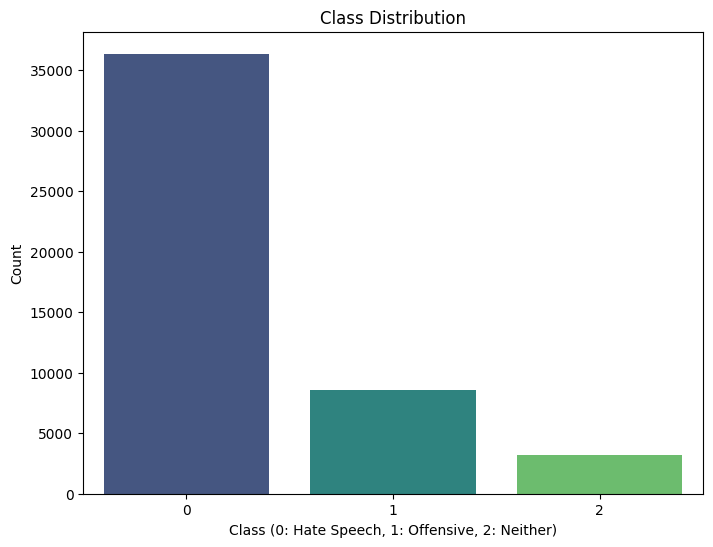

In [4]:
plt.figure(figsize=(8, 6))
sns.countplot(x='Class', data=df, palette='viridis')
plt.title('Class Distribution')
plt.xlabel('Class (0: Hate Speech, 1: Offensive, 2: Neither)')
plt.ylabel('Count')
plt.show()

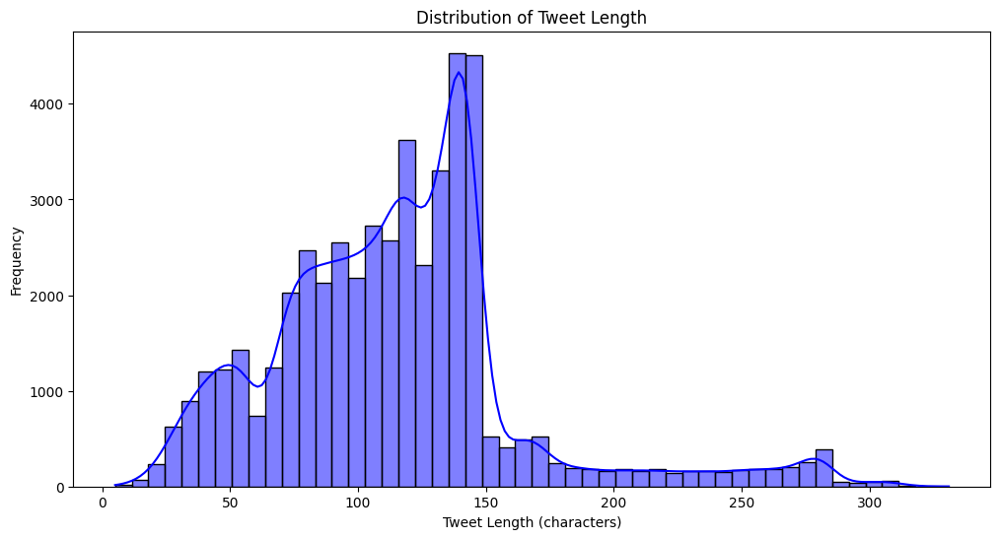

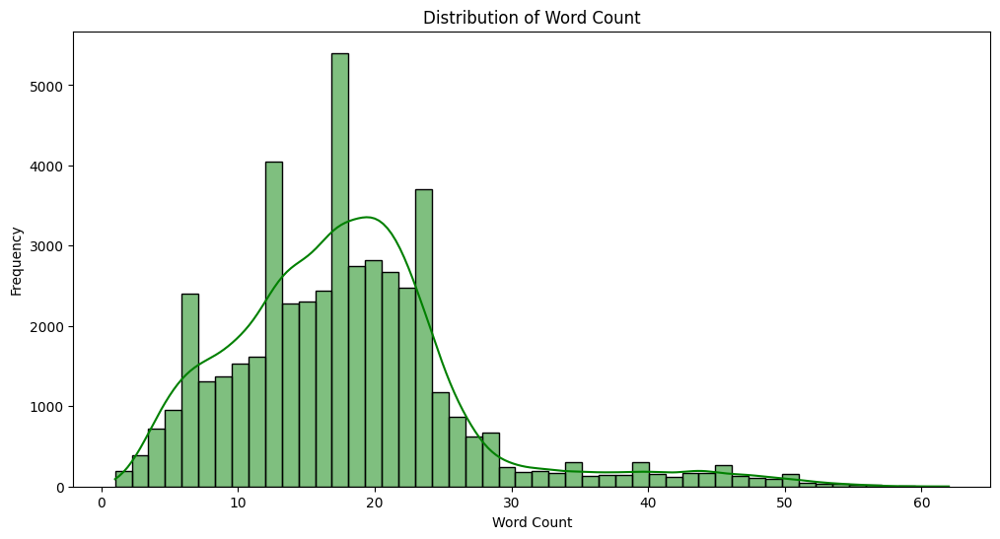

In [5]:
df['tweet_length'] = df['Tweet'].apply(lambda x: len(x))
df['word_count'] = df['Tweet'].apply(lambda x: len(str(x).split()))

# Plot distribution of tweet lengths
plt.figure(figsize=(12, 6))
sns.histplot(df['tweet_length'], bins=50, kde=True, color='blue')
plt.title('Distribution of Tweet Length')
plt.xlabel('Tweet Length (characters)')
plt.ylabel('Frequency')
plt.show()

# Plot distribution of word counts
plt.figure(figsize=(12, 6))
sns.histplot(df['word_count'], bins=50, kde=True, color='green')
plt.title('Distribution of Word Count')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.show()

In [6]:
#Preprocess Tweets
stop_words = stopwords.words('english')

def preprocess_tweet(tweet):
    tweet = re.sub(r'USERNAME_\w+', '', tweet)
    # Tokenize and lower the case
    tokens = nltk.word_tokenize(tweet.lower())
    # Remove stop words
    tokens = [word for word in tokens if word not in stop_words and word.isalpha()]
    cleaned_tweet = ' '.join(tokens)

    print(f"Original: {tweet}\nCleaned: {cleaned_tweet}\n")
    
    return cleaned_tweet

# Apply preprocessing to the 'Tweet' column
df['Tweet'] = df['Tweet'].fillna('')
df['cleaned_tweet'] = df['Tweet'].apply(preprocess_tweet)


Original: ['The political elite are in desperation. Ordinary kalenjins are suspicious of kikuyu community']
Cleaned: political elite desperation ordinary kalenjins suspicious kikuyu community

Original: ["Am just curious the only people who are calling him old and mad are Kikuyus and not Kalenjins and that's a good sign  "]
Cleaned: curious people calling old mad kikuyus kalenjins good sign

Original: [' the area politicians are the one to blame coz they r insiting local students n villagers to attack non kalenjins students']
Cleaned: area politicians one blame coz r insiting local students n villagers attack non kalenjins students

Original: ['War expected in Nakuru if something is not done . All Luos given Seven days to leave. Why are Kenyans Killing...']
Cleaned: expected nakuru something done luos given seven days leave kenyans killing

Original: [' tells kikuyus activists that they are being targeted. They have targetted  . They want to kill him.']
Cleaned: tells kikuyus activists

In [7]:
#Split to training and testing
X = df['Tweet']
Y = df['Class']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.2, random_state=42)

#USE TF-IDF Vectorizer to convert text into features
stop_words = stopwords.words('english')
TFIDF = TfidfVectorizer(stop_words=stop_words)

#Transform Training and Testing Data
X_train_TFIDF = TFIDF.fit_transform(X_train)
X_test_TFDIF = TFIDF.transform(X_test)

In [8]:
#Train the Logistic Regression Model
LR_Model = LogisticRegression()
LR_Model.fit(X_train_TFIDF, Y_train)

#Make Predictions on the test set
Y_pred_LR = LR_Model.predict(X_test_TFDIF)

Accuracy: 0.7468801996672213
Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.96      0.86      7166
           1       0.44      0.11      0.18      1806
           2       0.37      0.11      0.17       644

    accuracy                           0.75      9616
   macro avg       0.53      0.40      0.40      9616
weighted avg       0.68      0.75      0.68      9616



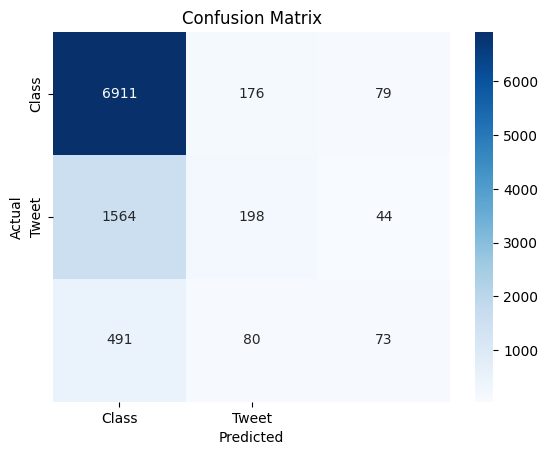

In [9]:
#Evaluate Model Accuracy
Accuracy = accuracy_score(Y_test, Y_pred_LR)
print(f'Accuracy: {Accuracy}')

#Generate and print Classification Report
print("Classification Report: ")
print(classification_report(Y_test, Y_pred_LR))

#Plot Confusion Matrix
CM = confusion_matrix(Y_test, Y_pred_LR)
sns.heatmap(CM, annot=True, fmt='d', cmap='Blues', xticklabels=['Class', 'Tweet'], yticklabels=['Class', 'Tweet'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


In [10]:
#Train the SVM Model
NB_Model = MultinomialNB()
NB_Model.fit(X_train_TFIDF, Y_train)

#Make Predictions on the test set
Y_pred_NB = NB_Model.predict(X_test_TFDIF)

Accuracy: 0.7457362728785357
Classification Report: 
              precision    recall  f1-score   support

           0       0.75      1.00      0.85      7166
           1       0.86      0.00      0.01      1806
           2       0.00      0.00      0.00       644

    accuracy                           0.75      9616
   macro avg       0.53      0.33      0.29      9616
weighted avg       0.72      0.75      0.64      9616



C:\Users\TAZ78\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\TAZ78\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\TAZ78\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classificati

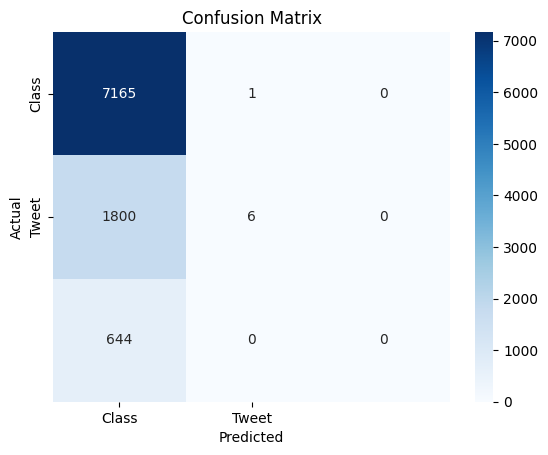

In [11]:
#Evaluate Model Accuracy
Accuracy = accuracy_score(Y_test, Y_pred_NB)
print(f'Accuracy: {Accuracy}')

#Generate and print Classification Report
print("Classification Report: ")
print(classification_report(Y_test, Y_pred_NB))

#Plot Confusion Matrix
CM = confusion_matrix(Y_test, Y_pred_NB)
sns.heatmap(CM, annot=True, fmt='d', cmap='Blues', xticklabels=['Class', 'Tweet'], yticklabels=['Class', 'Tweet'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [12]:
#Train the Random Forest Model
RF_Model = RandomForestClassifier()
RF_Model.fit(X_train_TFIDF, Y_train)

#Make Predictions on the test set
Y_pred_RF = RF_Model.predict(X_test_TFDIF)

In [ ]:
#Evaluate Model Accuracy
Accuracy = accuracy_score(Y_test, Y_pred_RF)
print(f'Accuracy: {Accuracy}')

#Generate and print Classification Report
print("Classification Report: ")
print(classification_report(Y_test, Y_pred_RF))

#Plot Confusion Matrix
CM = confusion_matrix(Y_test, Y_pred_RF)
sns.heatmap(CM, annot=True, fmt='d', cmap='Blues', xticklabels=['Class', 'Tweet'], yticklabels=['Class', 'Tweet'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

Report:
    Preprocessing the Data:
        1. Used stopwords to remove the common words
        2. Used TF-IDF to convert textual data to Numerical Values
        3. Tokenized the Tweets
    (Data was already preprocessed to an extent)

Trained the Models using Train_Test_Split

Used Logistic Regression, Naive Bayes and Random Forest

An issue for on how to class the multiclass data - Did so by making the Class an entity and Tweets an entity


